<a href="https://colab.research.google.com/github/shres-b/Data-Visualization-Project/blob/main/Video_Games_Sales_Data_Analysis_Project_using_Line_Plots.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Video Games Sales Data Analyis Project using Line Plots

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.subplots
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots

This dataset contains a list of video games with sales greater than 100,000 copies. It was generated by a scrape of vgchartz.com.

Fields include

Rank - Ranking of overall sales

Name - The games name

Platform - Platform of the games release (i.e. PC,PS4, etc.)

Year - Year of the game's release

Genre - Genre of the game

Publisher - Publisher of the game

NA_Sales - Sales in North America (in millions)

EU_Sales - Sales in Europe (in millions)

JP_Sales - Sales in Japan (in millions)

Other_Sales - Sales in the rest of the world (in millions)

Global_Sales - Total worldwide sales.

In [2]:
df = pd.read_csv('vgsales.csv')

In [3]:
df.head(5)

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16598 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Rank          16598 non-null  int64  
 1   Name          16598 non-null  object 
 2   Platform      16598 non-null  object 
 3   Year          16327 non-null  float64
 4   Genre         16598 non-null  object 
 5   Publisher     16540 non-null  object 
 6   NA_Sales      16598 non-null  float64
 7   EU_Sales      16598 non-null  float64
 8   JP_Sales      16598 non-null  float64
 9   Other_Sales   16598 non-null  float64
 10  Global_Sales  16598 non-null  float64
dtypes: float64(6), int64(1), object(4)
memory usage: 1.4+ MB


In [5]:
df.columns

Index(['Rank', 'Name', 'Platform', 'Year', 'Genre', 'Publisher', 'NA_Sales',
       'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales'],
      dtype='object')

In [6]:
df.isna().sum()

Rank              0
Name              0
Platform          0
Year            271
Genre             0
Publisher        58
NA_Sales          0
EU_Sales          0
JP_Sales          0
Other_Sales       0
Global_Sales      0
dtype: int64

Data cleaning by dropping the rows having null values for Year and Publisher

In [7]:
df1 = df.dropna(axis=0, subset=['Publisher'])


In [8]:
df1.Year.unique()

array([2006., 1985., 2008., 2009., 1996., 1989., 1984., 2005., 1999.,
       2007., 2010., 2013., 2004., 1990., 1988., 2002., 2001., 2011.,
       1998., 2015., 2012., 2014., 1992., 1997., 1993., 1994., 1982.,
       2003., 1986., 2000.,   nan, 1995., 2016., 1991., 1981., 1987.,
       1980., 1983., 2020., 2017.])

In [9]:
df2 = df1.dropna(axis=0, subset=['Year'])


In [10]:
df_cleansed = df2
df_cleansed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16291 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Rank          16291 non-null  int64  
 1   Name          16291 non-null  object 
 2   Platform      16291 non-null  object 
 3   Year          16291 non-null  float64
 4   Genre         16291 non-null  object 
 5   Publisher     16291 non-null  object 
 6   NA_Sales      16291 non-null  float64
 7   EU_Sales      16291 non-null  float64
 8   JP_Sales      16291 non-null  float64
 9   Other_Sales   16291 non-null  float64
 10  Global_Sales  16291 non-null  float64
dtypes: float64(6), int64(1), object(4)
memory usage: 1.5+ MB


In [11]:
# Converting float year type to int
df_cleansed['Year'] = df_cleansed['Year'].astype(int)
df_cleansed['Year'].dtype

dtype('int64')

Global Sales Per Year in Simulations Games using matplotlib and Seaborn

In [12]:
df_SimulationSales = df_cleansed[df_cleansed['Genre'] == 'Simulation'].groupby('Year')[['Global_Sales']].sum().reset_index()
df_SimulationSales.head()

,Year,Global_Sales
0,1981,0.45
1,1985,0.03
2,1988,0.03
3,1990,1.14
4,1991,2.14


Plotting the Year wise sales of genre:Simulation using matplotlib

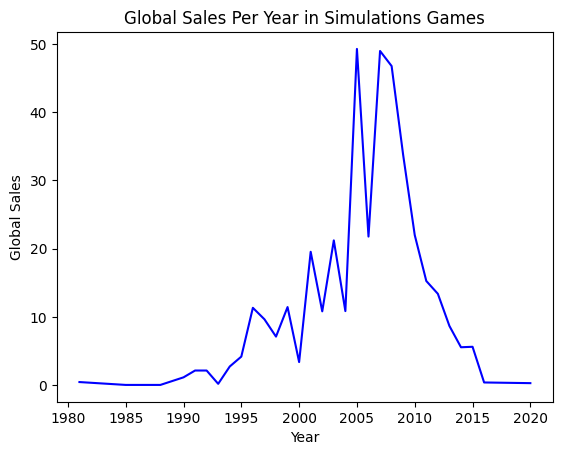

In [13]:
plt.plot(df_SimulationSales['Year'], df_SimulationSales['Global_Sales'], color='b')
plt.title('Global Sales Per Year in Simulations Games')
plt.xlabel('Year')
plt.ylabel('Global Sales')
plt.show()

Plotting the Year wise sales of genre:Simulation using Seaborn.As you can see the no of lines of code reduce using this library compared to Matplotlib


<Axes: xlabel='Year', ylabel='Global_Sales'>

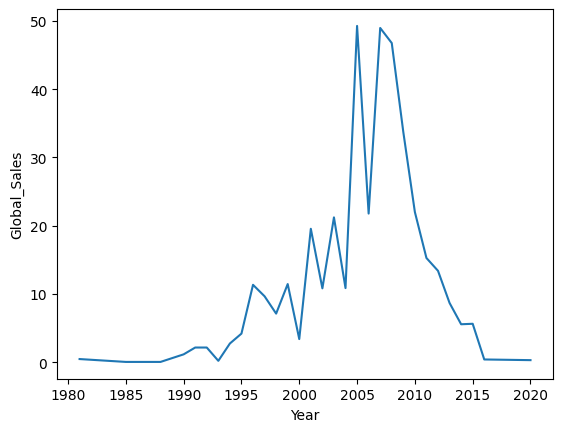

In [14]:
import seaborn as sns
sns.lineplot(x='Year', y='Global_Sales', data=df_SimulationSales)

Video Games Sales Per Each Market

In [15]:
df_group_year = df_cleansed.groupby('Year').sum().reset_index()



<ipython-input-15-d8f68aeb2360>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_group_year = df_cleansed.groupby('Year').sum().reset_index()


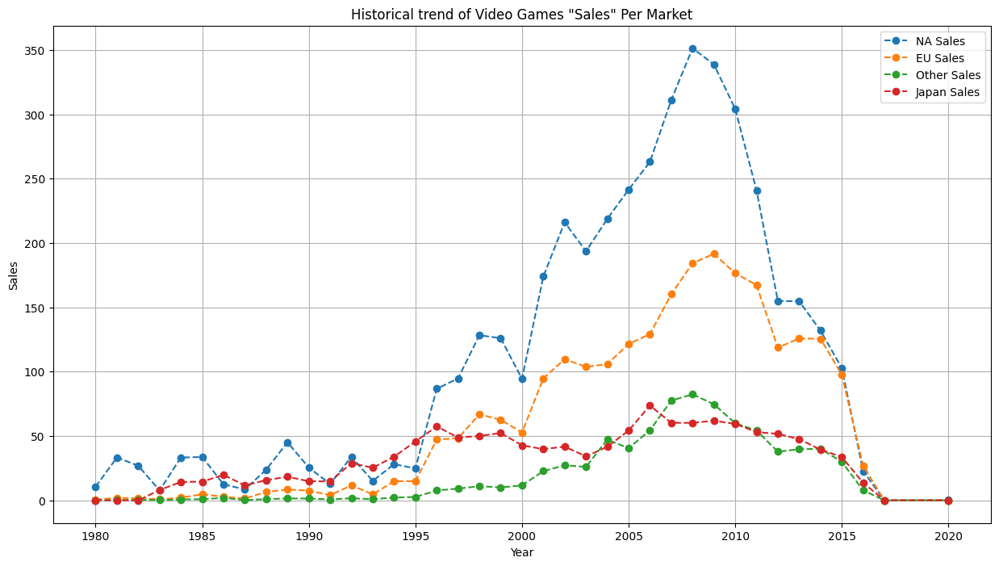

In [16]:
plt.figure(figsize=(15, 8))
plt.plot(df_group_year['Year'], df_group_year['NA_Sales'], label='NA Sales', marker='o', linestyle='dashed')
plt.plot(df_group_year['Year'], df_group_year['EU_Sales'], label = 'EU Sales', marker='o', linestyle='dashed')
plt.plot(df_group_year['Year'], df_group_year['Other_Sales'], label = 'Other Sales', marker='o', linestyle='dashed')
plt.plot(df_group_year['Year'], df_group_year['JP_Sales'], label = 'Japan Sales', marker='o', linestyle='dashed')
plt.title('Historical trend of Video Games "Sales" Per Market')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Sales')
plt.grid()
plt.show()

Video Games Sales Genre wise.It shows poulat categories of video games in each region.

In [ ]:
df_group_genre_only = df_cleansed.groupby(['Genre']).sum().reset_index().sort_values(by=['Global_Sales'], ascending=False).head(10)
df_group_genre_only

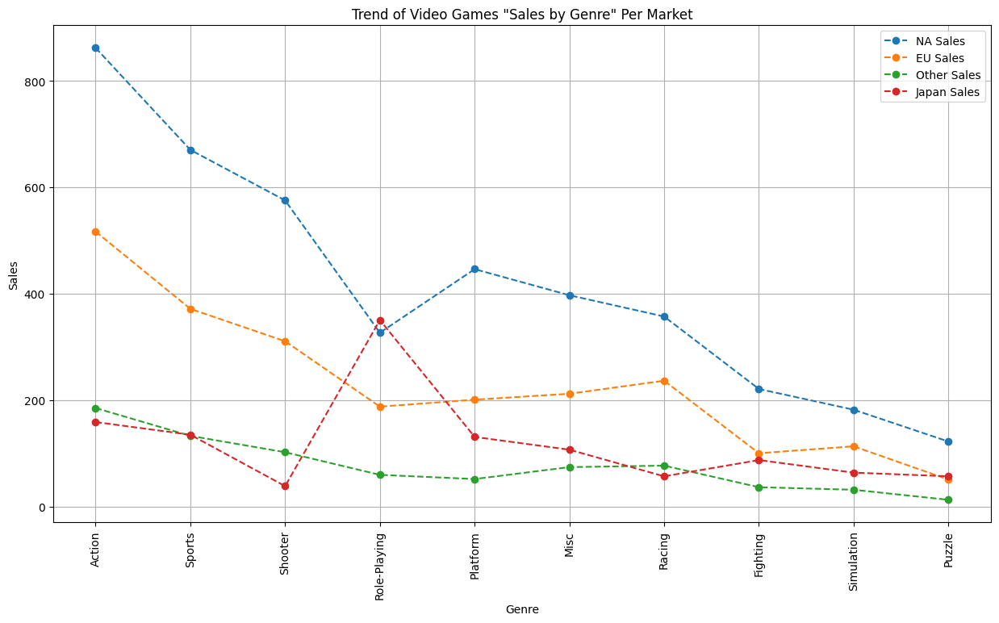

In [18]:
plt.figure(figsize=(15, 8))
plt.plot(df_group_genre_only['Genre'], df_group_genre_only['NA_Sales'], label='NA Sales', marker='o', linestyle='dashed')
plt.plot(df_group_genre_only['Genre'], df_group_genre_only['EU_Sales'], label = 'EU Sales', marker='o', linestyle='dashed')
plt.plot(df_group_genre_only['Genre'], df_group_genre_only['Other_Sales'], label = 'Other Sales', marker='o', linestyle='dashed')
plt.plot(df_group_genre_only['Genre'], df_group_genre_only['JP_Sales'], label = 'Japan Sales', marker='o', linestyle='dashed')
plt.title('Trend of Video Games "Sales by Genre" Per Market')
plt.xticks(rotation=90)
plt.xlabel('Genre')
plt.ylabel('Sales')
plt.legend()
plt.grid()
plt.show()

Using hue to plot the graph between Sales and Year but using hue we cans how different categories like Genre in this case

<ipython-input-19-72097fe21fb8>:2: UserWarning: 
The markers list has fewer values (1) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=df_cleansed, x='Year', y='Global_Sales',hue='Genre', style='Genre', markers='o', err_style=None)


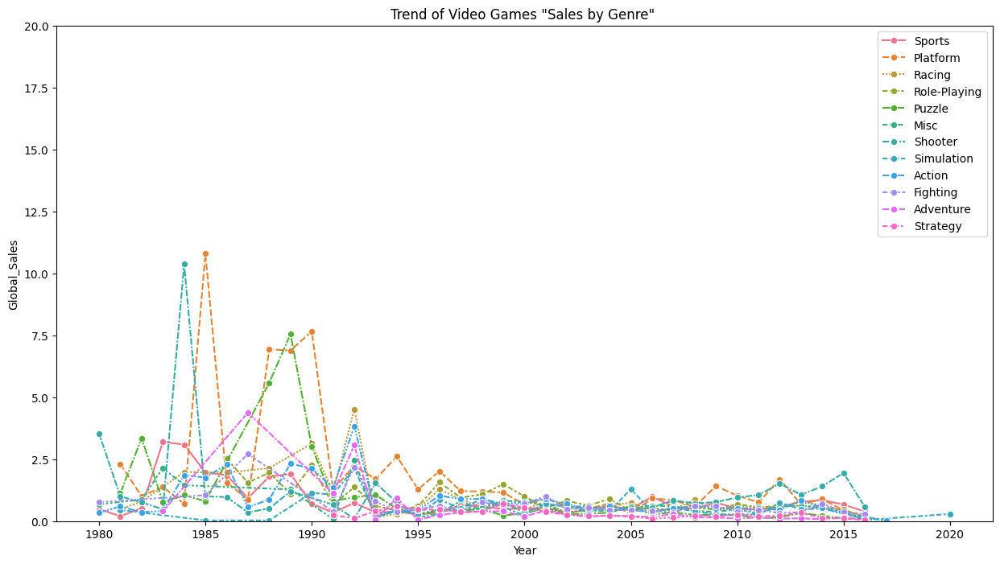

In [19]:
plt.figure(figsize=(15, 8))
sns.lineplot(data=df_cleansed, x='Year', y='Global_Sales',hue='Genre', style='Genre', markers='o', err_style=None)
plt.ylim(0,20)
plt.title('Trend of Video Games "Sales by Genre" ')
plt.legend()




Using different WrapperDescriptorType to plot the graph between Sales and Year but using hue we can show different categories like Genre in this case

In [ ]:
plt.figure(figsize=(15, 8))
df_sb=df_cleansed[['Year','Global_Sales','Genre']]

df_sb.set_index('Year',inplace=True)
print(df_sb)
groups=df_sb.groupby('Genre')
for name,group in groups:
  sns.lineplot(group.Global_Sales,linestyle='dashed', markers='o', label=name)

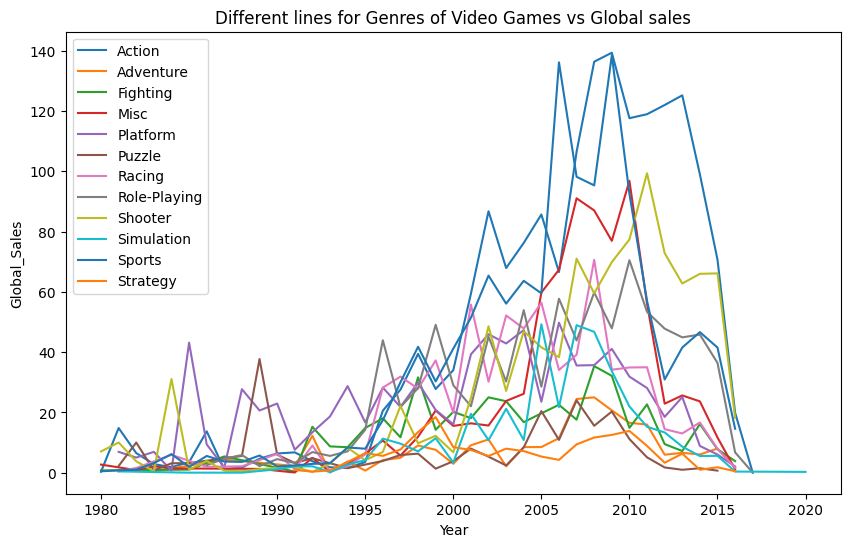

In [21]:
plt.figure(figsize=(10,6))
df_vtype=df_cleansed.groupby(['Year','Genre'],as_index=False)['Global_Sales'].sum()
df_vtype.set_index('Year',inplace=True)

df_vtype = df_vtype.groupby(['Genre'])['Global_Sales']
df_vtype.plot(kind='line')
plt.title('Different lines for Genres of Video Games vs Global sales')
plt.xlabel('Year')
plt.ylabel('Global_Sales')
plt.legend()
plt.show()

Publisher wise sales using line plots

In [22]:
df_group_publisher_only_top_10 = df_cleansed.groupby(['Publisher'])['NA_Sales',	'EU_Sales',	'JP_Sales',	'Other_Sales', 'Global_Sales'].sum().reset_index().sort_values(by=['Global_Sales'], ascending=False).head(10)


<ipython-input-22-2102a7bf3dde>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_group_publisher_only_top_10 = df_cleansed.groupby(['Publisher'])['NA_Sales',	'EU_Sales',	'JP_Sales',	'Other_Sales', 'Global_Sales'].sum().reset_index().sort_values(by=['Global_Sales'], ascending=False).head(10)


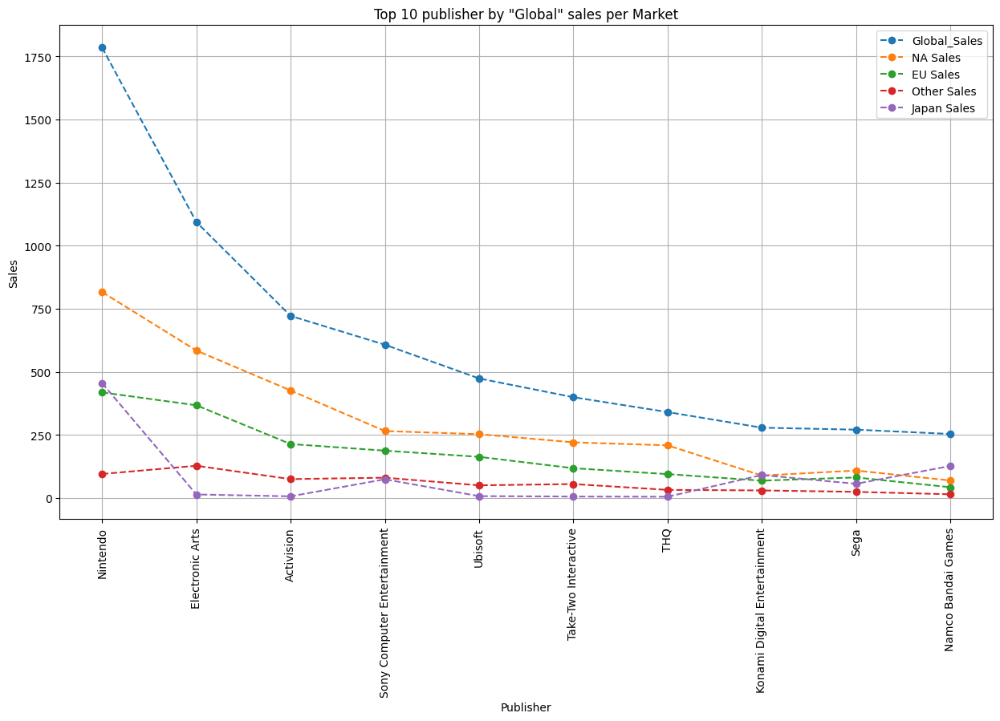

In [23]:
plt.figure(figsize=(15, 8))
plt.plot(df_group_publisher_only_top_10['Publisher'], df_group_publisher_only_top_10['Global_Sales'], label='Global_Sales', marker='o', linestyle='dashed')
plt.plot(df_group_publisher_only_top_10['Publisher'], df_group_publisher_only_top_10['NA_Sales'], label='NA Sales', marker='o', linestyle='dashed')
plt.plot(df_group_publisher_only_top_10['Publisher'], df_group_publisher_only_top_10['EU_Sales'], label = 'EU Sales', marker='o', linestyle='dashed')
plt.plot(df_group_publisher_only_top_10['Publisher'], df_group_publisher_only_top_10['Other_Sales'], label = 'Other Sales', marker='o', linestyle='dashed')
plt.plot(df_group_publisher_only_top_10['Publisher'], df_group_publisher_only_top_10['JP_Sales'], label = 'Japan Sales', marker='o', linestyle='dashed')
plt.title('Top 10 publisher by "Global" sales per Market')
plt.xticks(rotation=90)
plt.xlabel('Publisher')
plt.ylabel('Sales')
plt.legend()
plt.grid()
plt.show()

In [24]:
df_platcount = df_cleansed.groupby(df_cleansed['Platform'])[['Rank']].count().rename(columns = {'Rank':'counts'}).sort_values('counts', ascending = False).head(10)
df_platcount
fig = px.bar(df_platcount, x=df_platcount.index, y='counts', color='counts',height=400,title="Platforms per game sale")
fig.show()

Gaming Platform wise Sales

In [25]:
df_group_platform_only = df_cleansed.groupby(['Platform'])['NA_Sales',	'EU_Sales',	'JP_Sales',	'Other_Sales', 'Global_Sales'].mean().reset_index().sort_values(by=['Global_Sales'], ascending=False).head(10)


<ipython-input-25-bbce1ce3acb9>:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



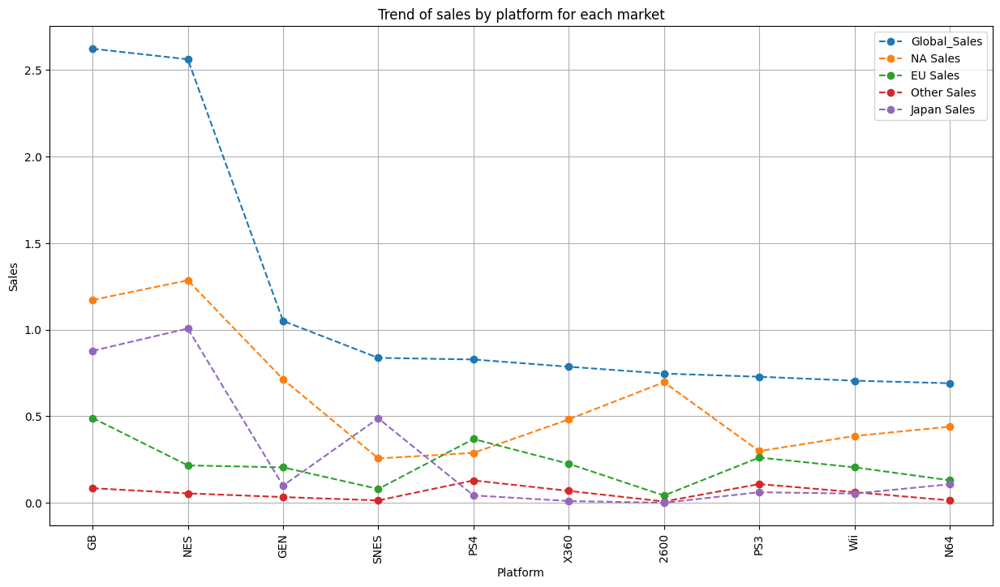

In [26]:
plt.figure(figsize=(15, 8))
plt.plot(df_group_platform_only['Platform'], df_group_platform_only['Global_Sales'], label='Global_Sales', marker='o', linestyle='dashed')
plt.plot(df_group_platform_only['Platform'], df_group_platform_only['NA_Sales'], label='NA Sales', marker='o', linestyle='dashed')
plt.plot(df_group_platform_only['Platform'], df_group_platform_only['EU_Sales'], label = 'EU Sales', marker='o', linestyle='dashed')
plt.plot(df_group_platform_only['Platform'], df_group_platform_only['Other_Sales'], label = 'Other Sales', marker='o', linestyle='dashed')
plt.plot(df_group_platform_only['Platform'], df_group_platform_only['JP_Sales'], label = 'Japan Sales', marker='o', linestyle='dashed')
plt.title('Trend of sales by platform for each market')
plt.xticks(rotation=90)
plt.xlabel('Platform')
plt.ylabel('Sales')
plt.legend()
plt.grid()
plt.show()

Using preproc to plot the sales compariosn in different regions

In [ ]:
data_preproc = df_cleansed[['Year','EU_Sales','NA_Sales','JP_Sales','Other_Sales','Global_Sales']]
data_preproc.set_index("Year",inplace=True)
print(data_preproc)
sns.lineplot(data=data_preproc).set(title='Video Games sales in diff regions', xlabel='Year', ylabel='Sales')


In [28]:
new_df=df_cleansed.groupby(['Publisher'])['Global_Sales'].sum().reset_index()
new_df
t1 = df_cleansed[df_cleansed['Global_Sales'] > 10]
t1


,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
...,...,...,...,...,...,...,...,...,...,...,...
57,58,Super Mario All-Stars,SNES,1993,Platform,Nintendo,5.99,2.15,2.12,0.29,10.55
58,59,Pokemon FireRed/Pokemon LeafGreen,GBA,2004,Role-Playing,Nintendo,4.34,2.65,3.15,0.35,10.49
59,60,Super Mario 64,DS,2004,Platform,Nintendo,5.08,3.11,1.25,0.98,10.42
60,61,Just Dance 3,Wii,2011,Misc,Ubisoft,6.05,3.15,0.00,1.07,10.26


After a small dip in sales 2003/2004,sales exploded and peaked 2008-2010. Also known as the golden age of gaming

In [29]:
df_yearcount =df_cleansed.groupby(df_cleansed['Year'])[['Rank']].count().rename(columns={'Rank':'counts'})
df_yearsales =df_cleansed.groupby(df_cleansed['Year'])[['Global_Sales']].sum()

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Bar(x=df_yearcount.index, y=df_yearcount['counts'], marker=dict(color='rgba(17, 145, 171, 0.6)'), name = 'counts'),
    secondary_y=False,
)
fig.add_trace(
    go.Scatter(x=df_yearsales.index, y=df_yearsales['Global_Sales'], name='Global_Sales'),
    secondary_y=True,
)
fig.update_xaxes(title_text="Year")
fig.update_yaxes(title_text="<b>Sales in Millions</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Global_Sales</b>", secondary_y=True)
fig.show()


In [30]:
#Using Bokeh  the sales per year for different genres

from bokeh.plotting import figure,show
from bokeh.palettes import Dark2_5 as palettes
from bokeh.resources import INLINE
import bokeh.io
bokeh.io.output_notebook(INLINE)
import itertools
from bokeh.palettes import Spectral3,Spectral4
colors=itertools.cycle(palettes)
from bokeh.models import ColumnDataSource, CDSView, GroupFilter, HoverTool,Legend,LegendItem,LinearAxis,Grid,BoxAnnotation

bokeh.plotting.plot_height=400
bokeh.plotting.plot_width=800
df_bokeh = df_cleansed[['Year', 'Global_Sales', 'Genre']]
groups =df_bokeh.groupby(['Genre'])
p=figure(x_axis_label='Year',y_axis_label='Global_Sales')
colors=itertools.cycle(palettes)
for name ,group in groups:
    color_=next(colors)
    tempdf = group.groupby('Year')['Global_Sales'].sum().reset_index(name ='Global_Sales')
    p.line(tempdf.Year,tempdf.Global_Sales,legend_label=name,color=color_)
    p.circle(tempdf.Year,tempdf.Global_Sales,legend_label=name,color=color_)
    p.title='Yerly tend of Global Sales'
    p.height=600
    p.width=1200
print(p)
show(p)

<ipython-input-30-56e39ad3c2a0>:19: FutureWarning:

In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.



figure(id='p1001', ...)


In [31]:
#Using Plotly to show the sales per year for different genres

import plotly.graph_objects as go
layout = dict(xaxis=dict(title='Year'), yaxis=dict(title='Global Sales'))
fig = go.Figure(layout=layout)

df_plotly = df_cleansed[['Year', 'Global_Sales', 'Genre']]
groups = df_plotly.groupby(['Genre'])

for grpname ,group in groups:
  tempdf = group.groupby('Year')['Global_Sales'].sum().reset_index(name ='Global_Sales')
  fig.add_trace(go.Scatter(x=tempdf['Year'], y=tempdf['Global_Sales'], name=grpname))

fig.update_layout(title='Yearly tend of Global Sales')
fig.show()

<ipython-input-31-ad01d8f1a3fa>:10: FutureWarning:

In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.



Using plotly.graph_objects as go to plot the line chart

Using Bokeh to plot the line plot

In [32]:
df_g = df_cleansed.groupby(['Year','Genre'])['JP_Sales','NA_Sales','Other_Sales','EU_Sales'].sum().reset_index()

list1=['JP_Sales','NA_Sales','EU_Sales','Other_Sales']
l=(list1[0])
p = figure(width=1000)
p.line(x=df_g['Year'], y=df_g['JP_Sales'], line_width=2,color=Spectral3[2])
p.line(x=df_g['Year'], y=df_g['NA_Sales'], line_width=2,color=Spectral3[1])
p.line(x=df_g['Year'], y=df_g['EU_Sales'], line_width=2,color=Spectral3[0])
p.line(x=df_g['Year'], y=df_g['Other_Sales'], line_width=2,color=Spectral4[2])
p.title.text = 'Global Sales Genre wise'
p.xaxis.axis_label = 'Year'
p.yaxis.axis_label ='Sales'
xaxis = LinearAxis()
p.add_layout(xaxis, 'below')
yaxis = LinearAxis()
p.add_layout(yaxis, 'left')
p.add_layout(Grid(dimension=0, ticker=xaxis.ticker))
p.add_layout(Grid(dimension=1, ticker=yaxis.ticker))

li1 = LegendItem(label='JP_Sales', renderers=[p.renderers[0]])
li2 = LegendItem(label='NA_Sales', renderers=[p.renderers[1]])
li3 = LegendItem(label='EU_Sales', renderers=[p.renderers[2]])
li4 = LegendItem(label='Other_Sales', renderers=[p.renderers[3]])

legend1 = Legend(items=[li1, li2, li3,li4], location='top_right')
p.add_layout(legend1)

show(p)

<ipython-input-32-987a4d547548>:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.

